<a href="https://colab.research.google.com/github/MichaelTj02/FinalProject_Group1/blob/main/ComputerVisionProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><h1> <b> Helmet Detection Using YOLO <b> </h1></center>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2
import seaborn as sns
import glob
import xml.etree.ElementTree as ET
from PIL import Image
import os
import shutil

In [ ]:
#Michael's dataset location
test_dir = '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/val'
train_dir = '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/train'

In [ ]:
#Ryan's dataset location
test_dir = r'/Desktop/Datasets/MotorcycleHelmetDataset/images/val'
train_dir = r'/Desktop/Datasets/MotorcycleHelmetDataset/images/train'

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
Setup complete  (20 CPUs, 15.8 GB RAM, 811.6/952.6 GB disk)


In [ ]:
from ultralytics import YOLO

## Training YOLO

In [ ]:
model = YOLO('yolov8s.pt') # pretrained model

**Michael's Path**

In [ ]:
%%writefile config.yaml
path: /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset
train: /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train
#test: (test dataset folder path)
val: /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/val

# Classes
nc: 4 # replace based on your dataset's number of classes

# Class names
# replace all class names with your own classes' names
names:
  0: with helmet
  1: without helmet
  2: rider
  3: number plate

Writing config.yaml


**Ryan's Path**

In [ ]:
%%writefile config.yaml

path: C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset
train: C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\train
#test: (test dataset folder path)
val: C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\val

# Classes
nc: 4 # replace based on your dataset's number of classes

# Class names
# replace all class names with your own classes' names
names:
  0: with helmet
  1: without helmet
  2: rider
  3: number plate

Overwriting config.yaml


# Untuned Model

In [ ]:
model.train(data="config.yaml",epochs=5,patience=5,batch=8, lr0=0.0005,imgsz=640, name="custom_training_run")

Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=custom_training_run11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

train: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\train.cache... 143 images, 0 backgrounds

train: WARNING  C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\train\new128.jpg: ignoring corrupt image/label: cannot identify image file 'C:\\Users\\RyRyN\\Desktop\\Datasets\\MotorcycleHelmetDataset\\images\\train\\new128.jpg'
train: WARNING  C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\train\new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'heic', 'pfm', 'bmp', 'webp', 'mpo', 'jpg', 'png', 'tif', 'tiff', 'dng', 'jpeg'}
videos: {'mpg', 'webm', 'gif', 'mpeg', 'mp4', 'wmv', 'avi', 'm4v', 'ts', 'mkv', 'mov', 'asf'}



val: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\val.cache... 40 images, 0 backgrounds, 0 c


Plotting labels to runs\detect\custom_training_run11\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\custom_training_run11
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.19G      1.223       2.81      1.377         64        640: 100%|██████████| 18/18 [00:03<00:00,  4.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0

                   all         40        177      0.611      0.637        0.6      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.13G     0.9369       1.17      1.115         58        640: 100%|██████████| 18/18 [00:02<00:00,  8.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0

                   all         40        177      0.643       0.68      0.679      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.17G     0.8876     0.9076      1.085         52        640: 100%|██████████| 18/18 [00:01<00:00,  9.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0


                   all         40        177      0.718      0.765      0.812      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.09G     0.8946     0.8537      1.101         82        640: 100%|██████████| 18/18 [00:01<00:00,  9.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0

                   all         40        177      0.797      0.835      0.867      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       2.1G     0.8163     0.7755      1.071         43        640: 100%|██████████| 18/18 [00:01<00:00,  9.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0

                   all         40        177      0.817      0.804      0.867      0.617



5 epochs completed in 0.007 hours.
Optimizer stripped from runs\detect\custom_training_run11\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\custom_training_run11\weights\best.pt, 22.5MB

Validating runs\detect\custom_training_run11\weights\best.pt...
Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<0


                   all         40        177      0.818      0.804      0.867      0.617
           with helmet         23         30      0.714        0.9      0.905      0.649
        without helmet         20         38       0.78      0.561       0.74      0.512
                 rider         40         59      0.871      0.915      0.941      0.725
          number plate         38         50      0.908       0.84      0.884      0.583
Speed: 0.2ms preprocess, 3.3ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs\detect\custom_training_run11


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001A016FE2BD0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
       

In [ ]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category
metrics.box.mp    # P
metrics.box.mr    # R

Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\val.cache... 40 images, 0 backgrounds, 0 c
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<0


                   all         40        177      0.816       0.81      0.867      0.619
           with helmet         23         30      0.711        0.9      0.905       0.65
        without helmet         20         38      0.788      0.586      0.742      0.507
                 rider         40         59      0.871      0.915      0.942      0.727
          number plate         38         50      0.893       0.84      0.879      0.592
Speed: 0.8ms preprocess, 17.0ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\custom_training_run112


np.float64(0.8102769272590118)

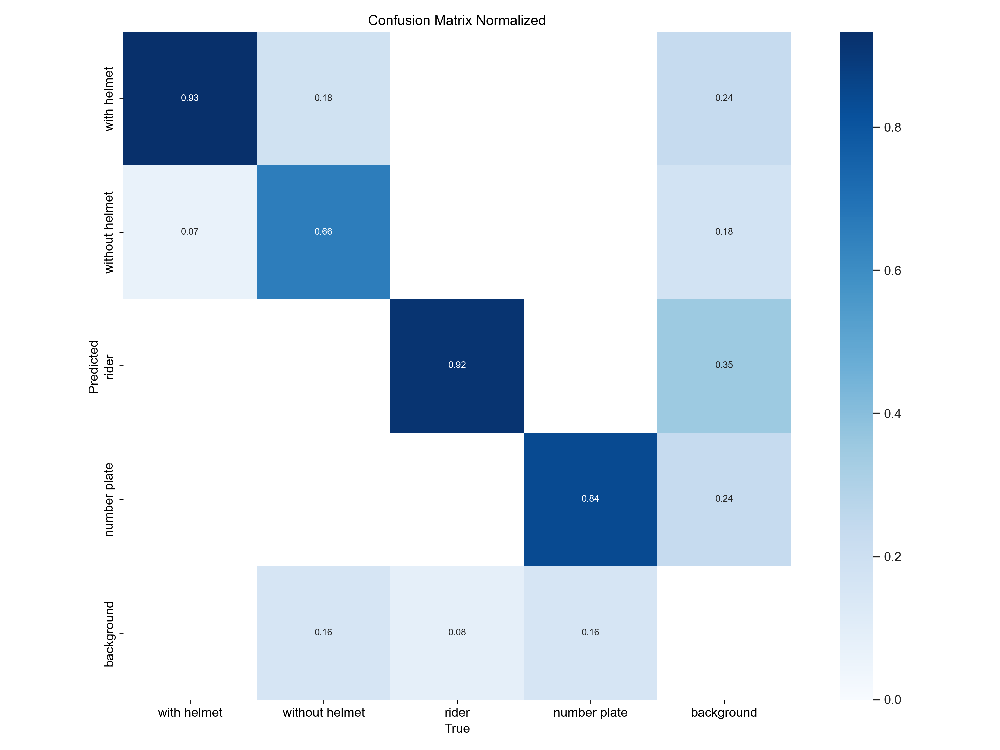

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/custom_training_run112/confusion_matrix_normalized.png')

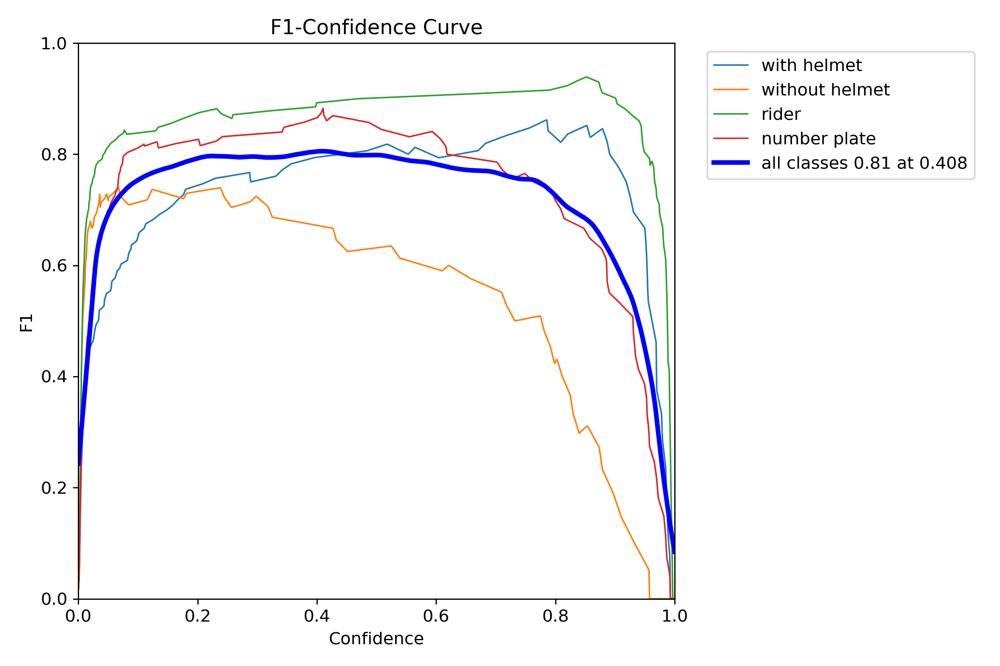

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/custom_training_run112/F1_curve.png')

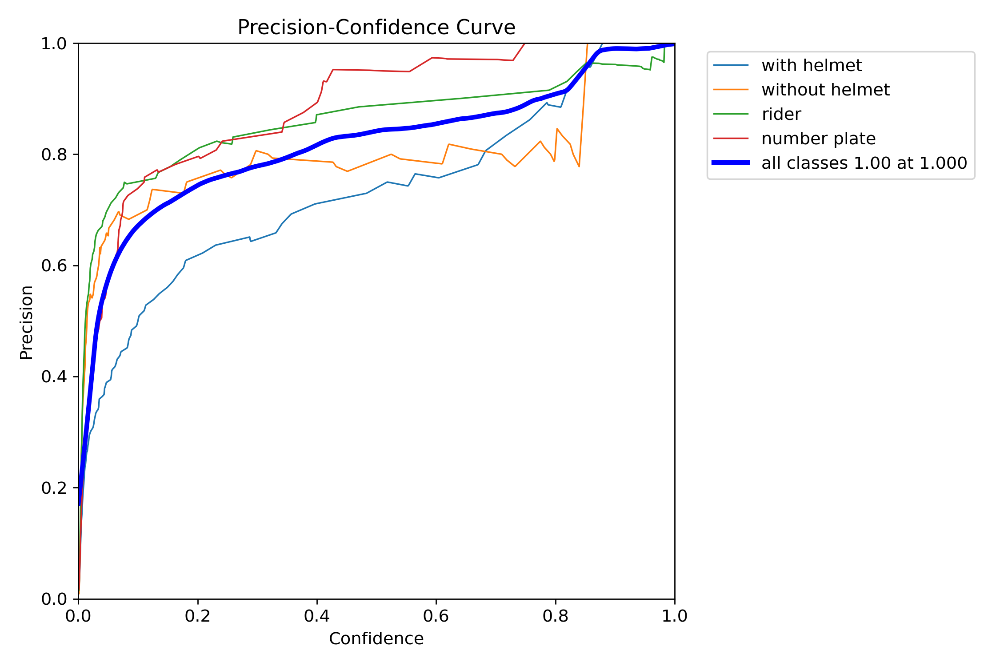

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/custom_training_run112/P_curve.png')

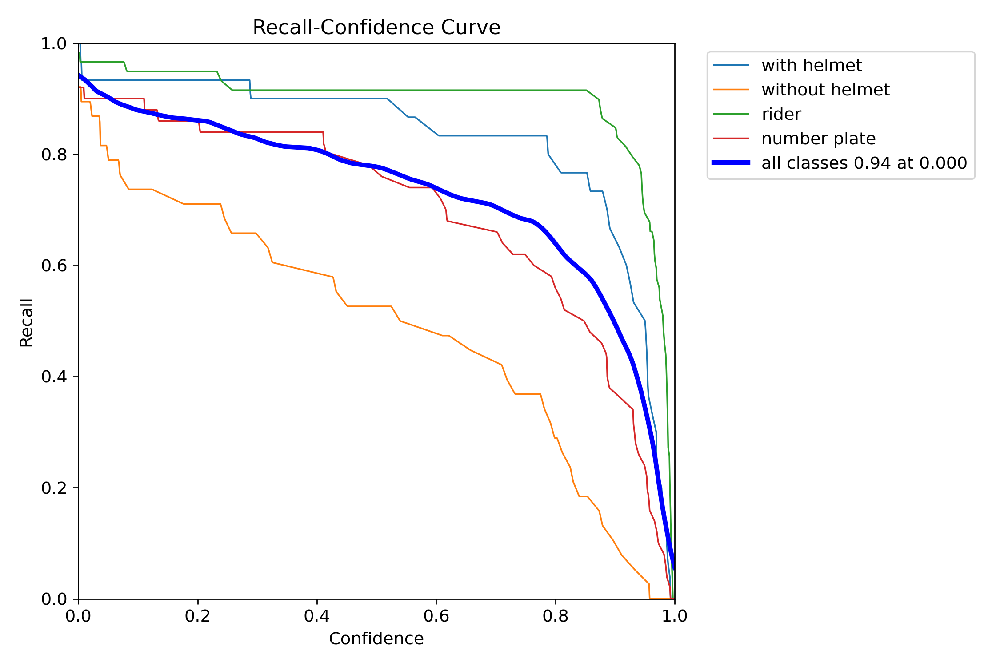

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/custom_training_run112/R_curve.png')

**Predictions**

In [ ]:
model = YOLO('C:/Users/RyRyN/runs/detect/custom_training_run11/weights/best.pt')  # load a custom model

In [ ]:
# Prediction 1: image from dataset
results = model('C:/Users/RyRyN/Desktop/Datasets/MotorcycleHelmetDataset/images/val/new200.jpeg', save=True)


image 1/1 C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\val\new200.jpeg: 384x640 1 with helmet, 1 rider, 68.4ms
Speed: 2.0ms preprocess, 68.4ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict


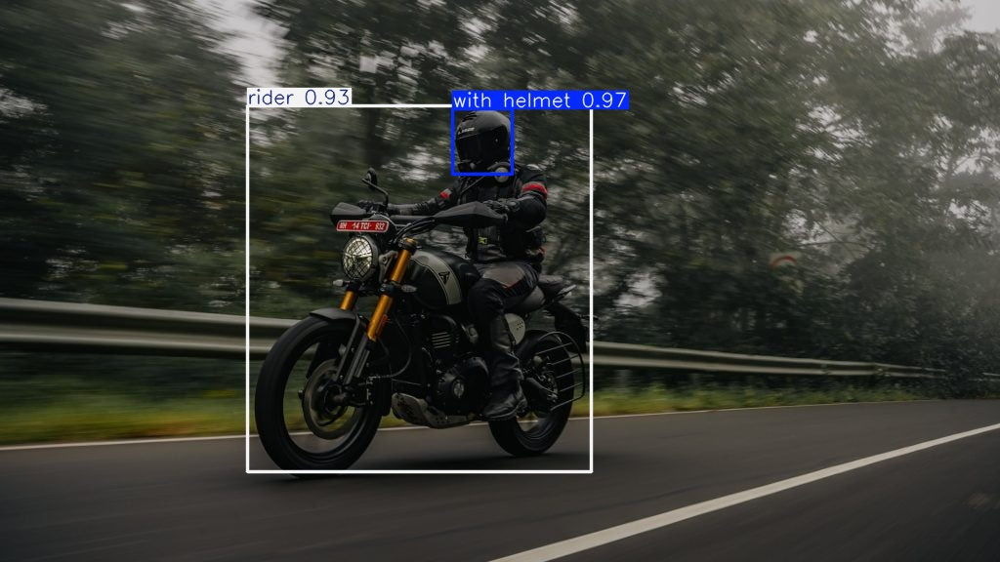

In [ ]:
# Prediction 1
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict/new200.jpg')

In [ ]:
# Prediction 2: image from dataset
results = model('C:/Users/RyRyN/Desktop/Datasets/MotorcycleHelmetDataset/images/val/new193.jpg', save=True)


image 1/1 C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\val\new193.jpg: 384x640 2 with helmets, 2 riders, 2 number plates, 12.6ms
Speed: 2.0ms preprocess, 12.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict


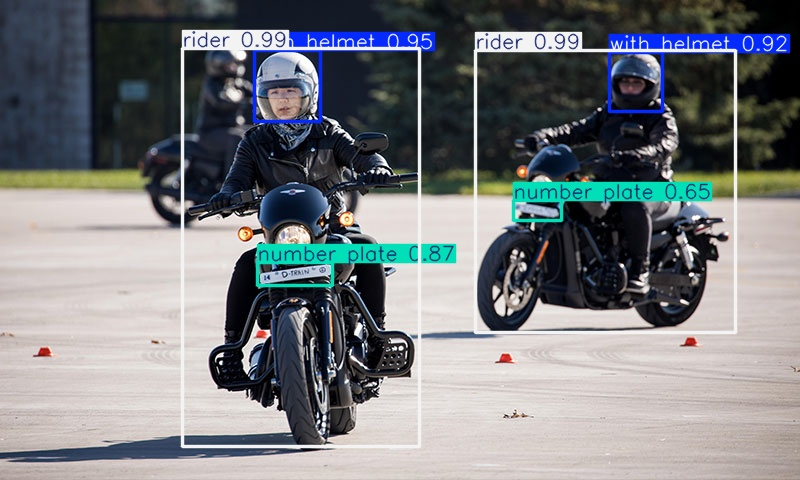

In [ ]:
# Prediction 2
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict/new193.jpg')

In [ ]:
# Prediction 3: image from internet
results = model('https://i0.wp.com/emodiblog.com/wp-content/uploads/2020/12/IN23138.jpeg', save=True)


⚠️ Download failure, retrying 1/3 https://i0.wp.com/emodiblog.com/wp-content/uploads/2020/12/IN23138.jpeg...
image 1/1 /content/IN23138.jpeg: 448x640 2 with helmets, 1 without helmet, 5 riders, 2 number plates, 66.6ms
Speed: 3.8ms preprocess, 66.6ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


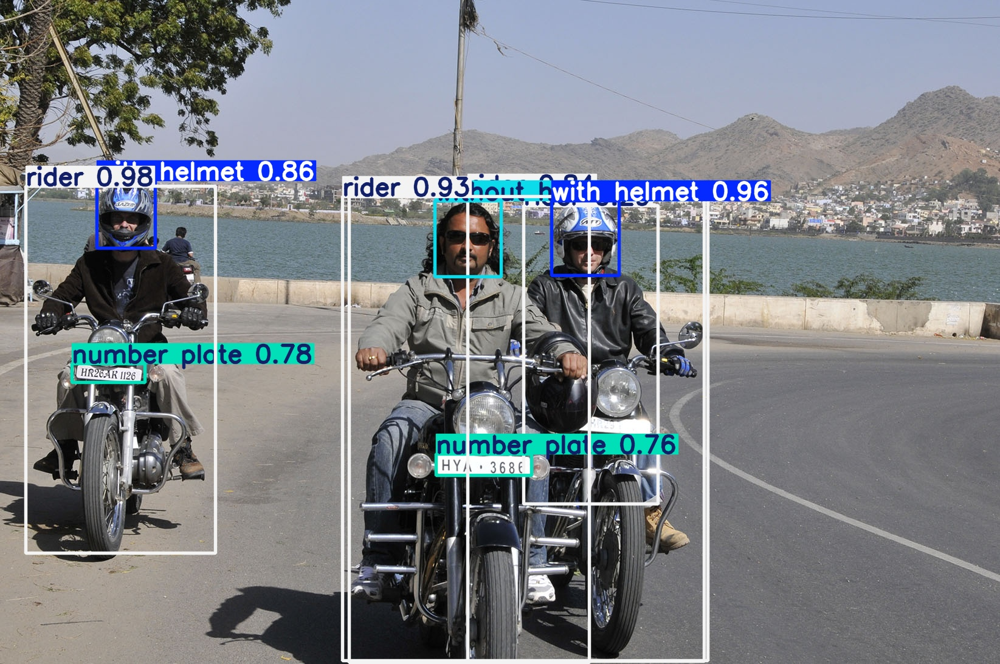

In [ ]:
# Prediction 3
%matplotlib inline
from PIL import Image

Image.open('/content/runs/detect/predict/IN23138.jpg')

In [ ]:
# Prediction 4: image from internet
results = model('https://asset.kompas.com/crops/K_m7YMjIBYTUr2BNiRLsK8pG2-E=/1526x533:3458x1820/1200x800/data/photo/2023/12/06/657008588aa92.jpeg', save=True)

100%|██████████| 200k/200k [00:00<00:00, 33.7MB/s]

image 1/1 /content/657008588aa92.jpeg: 448x640 1 without helmet, 1 rider, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


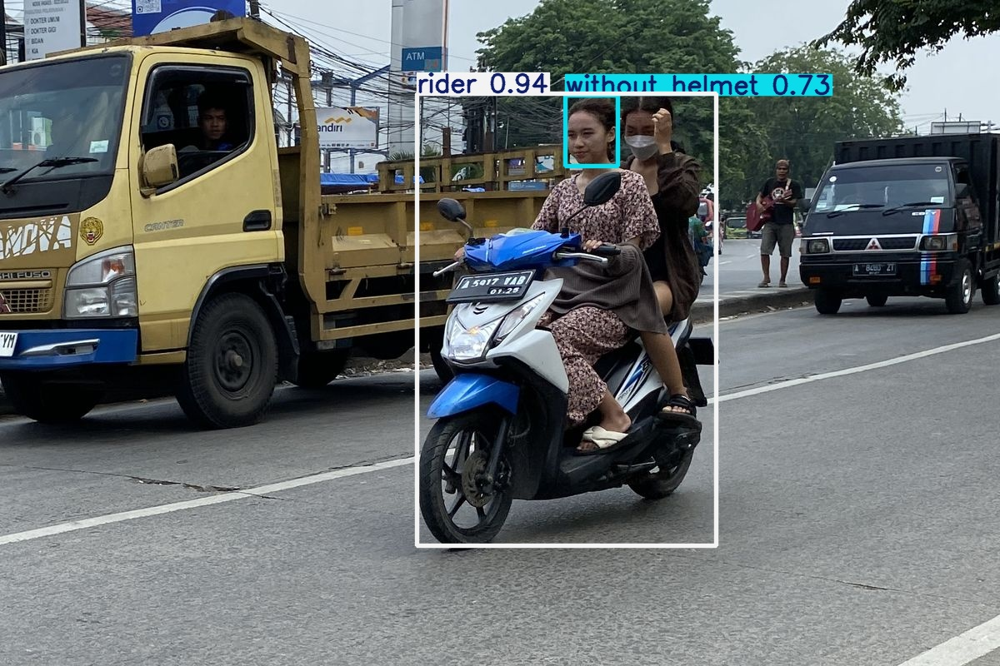

In [ ]:
# Prediction 4
%matplotlib inline
from PIL import Image

Image.open('/content/runs/detect/predict/657008588aa92.jpg')

# Tuned Model

In [ ]:
# best parameters
model.train(data="config.yaml",
    epochs=10,
    patience=5,
    batch=32,
    lr0=0.05,
    imgsz=640,
    name="tuned_model"
)

New https://pypi.org/project/ultralytics/8.3.48 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=config.yaml, epochs=10, time=None, patience=5, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=tuned_model10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frame

train: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\train.cache... 143 images, 0 backgrounds

train: WARNING  C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\train\new128.jpg: ignoring corrupt image/label: cannot identify image file 'C:\\Users\\RyRyN\\Desktop\\Datasets\\MotorcycleHelmetDataset\\images\\train\\new128.jpg'
train: WARNING  C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\train\new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'heic', 'pfm', 'bmp', 'webp', 'mpo', 'jpg', 'png', 'tif', 'tiff', 'dng', 'jpeg'}
videos: {'mpg', 'webm', 'gif', 'mpeg', 'mp4', 'wmv', 'avi', 'm4v', 'ts', 'mkv', 'mov', 'asf'}



val: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\val.cache... 40 images, 0 backgrounds, 0 c


Plotting labels to runs\detect\tuned_model10\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.05' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\tuned_model10
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      7.73G     0.6705     0.5546     0.9083         60        640: 100%|██████████| 5/5 [00:02<00:00,  1.94
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<0

                   all         40        177      0.862       0.76       0.87      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       7.4G     0.6791     0.5659     0.9548         59        640: 100%|██████████| 5/5 [00:02<00:00,  2.46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.787      0.792      0.861      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.24G     0.6094     0.5195     0.9016         56        640: 100%|██████████| 5/5 [00:01<00:00,  2.80
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177       0.81      0.856      0.861      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      7.39G     0.6506     0.5198     0.9226         64        640: 100%|██████████| 5/5 [00:01<00:00,  2.87
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.806       0.83      0.854      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.24G      0.608     0.5052     0.9035         57        640: 100%|██████████| 5/5 [00:01<00:00,  2.86
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.827      0.843      0.897      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.39G     0.5848     0.4676     0.9016         72        640: 100%|██████████| 5/5 [00:01<00:00,  2.76
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177       0.81      0.839       0.88      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      7.29G     0.5825     0.4417     0.9001         47        640: 100%|██████████| 5/5 [00:01<00:00,  2.94
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.824      0.831      0.886      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.33G       0.58     0.4445      0.903         49        640: 100%|██████████| 5/5 [00:01<00:00,  2.93
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.854      0.785      0.882       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      7.39G     0.5731     0.4167     0.8909         57        640: 100%|██████████| 5/5 [00:01<00:00,  2.96
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.813      0.837      0.881      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.33G     0.5716     0.4002     0.8818         62        640: 100%|██████████| 5/5 [00:01<00:00,  2.91
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         40        177      0.854      0.815      0.883      0.646
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 5, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



10 epochs completed in 0.030 hours.
Optimizer stripped from runs\detect\tuned_model10\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\tuned_model10\weights\best.pt, 22.5MB

Validating runs\detect\tuned_model10\weights\best.pt...
Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0


                   all         40        177      0.828      0.843      0.897      0.656
           with helmet         23         30      0.662      0.933      0.935      0.693
        without helmet         20         38       0.84      0.689       0.83       0.58
                 rider         40         59      0.879      0.949       0.94      0.771
          number plate         38         50       0.93        0.8      0.884      0.581
Speed: 0.3ms preprocess, 6.8ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs\detect\tuned_model10


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FC3A2BF390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
       

In [ ]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category
metrics.box.mp    # P
metrics.box.mr    # R

Ultralytics 8.3.47  Python-3.11.5 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\labels\val.cache... 40 images, 0 backgrounds, 0 c
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<0


                   all         40        177      0.864      0.794      0.867      0.634
           with helmet         23         30      0.724      0.967      0.883      0.624
        without helmet         20         38      0.824      0.616      0.774      0.555
                 rider         40         59      0.964      0.896      0.929      0.752
          number plate         38         50      0.946      0.697      0.881      0.606
Speed: 2.3ms preprocess, 11.9ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs\detect\tuned_model62


np.float64(0.7938616868192219)

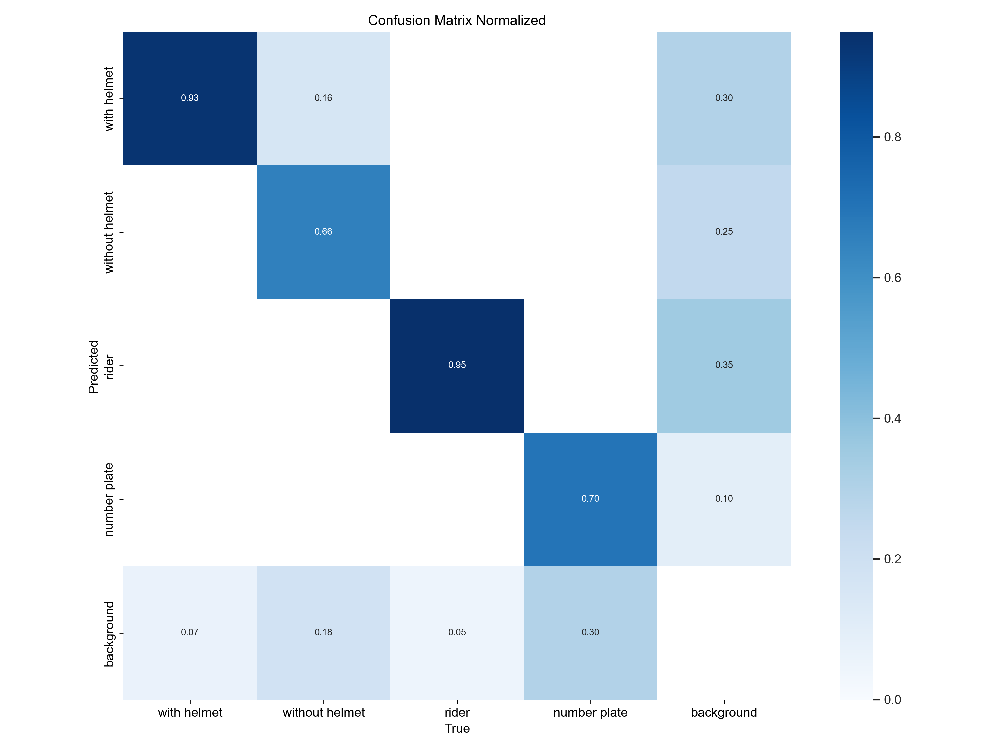

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/tuned_model10/confusion_matrix_normalized.png')

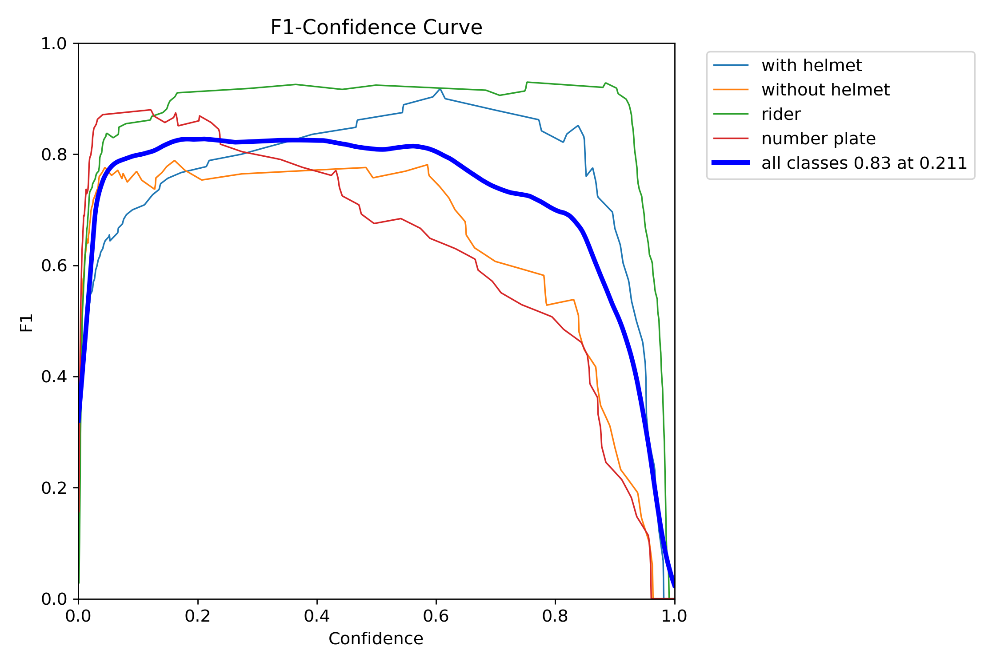

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/tuned_model10/F1_curve.png')

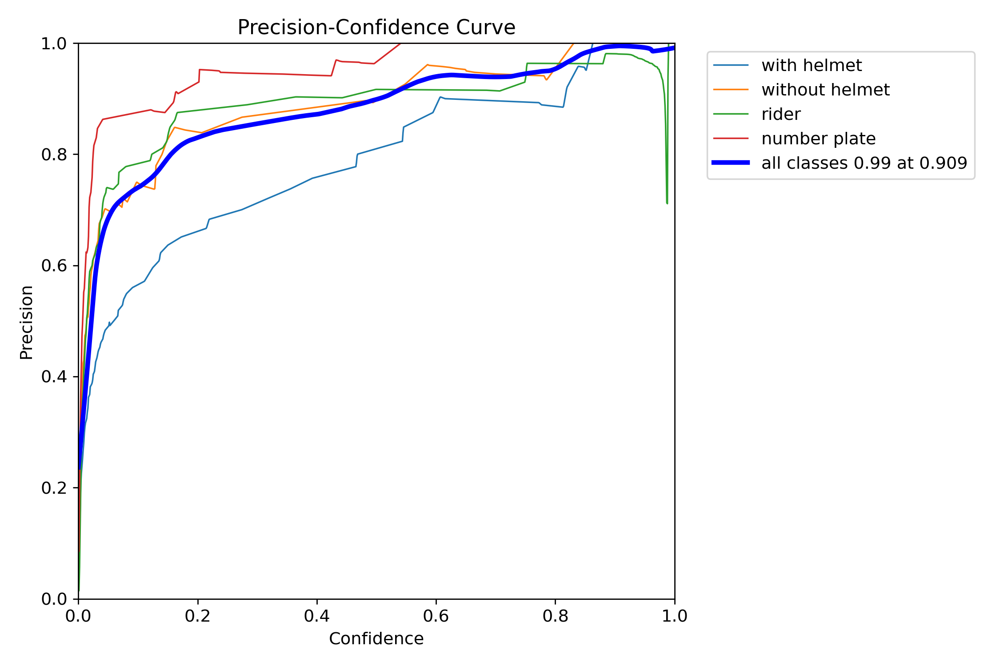

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/tuned_model10/P_curve.png')

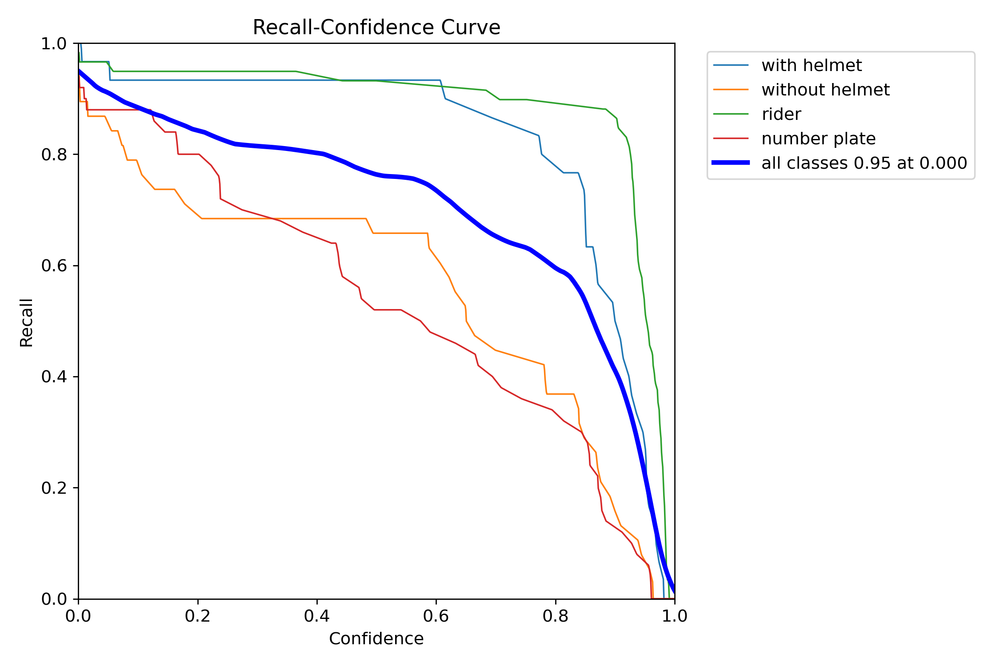

In [ ]:
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/tuned_model10/R_curve.png')

##Predictions

In [ ]:
model = YOLO('C:/Users/RyRyN/runs/detect/tuned_model10/weights/best.pt')  # load tuned model

# Prediction 1: image from dataset
results = model('C:/Users/RyRyN/Desktop/Datasets/MotorcycleHelmetDataset/images/val/new200.jpeg', save=True)


image 1/1 C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\val\new200.jpeg: 384x640 1 with helmet, 1 rider, 1 number plate, 222.8ms
Speed: 2.0ms preprocess, 222.8ms inference, 12.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict6


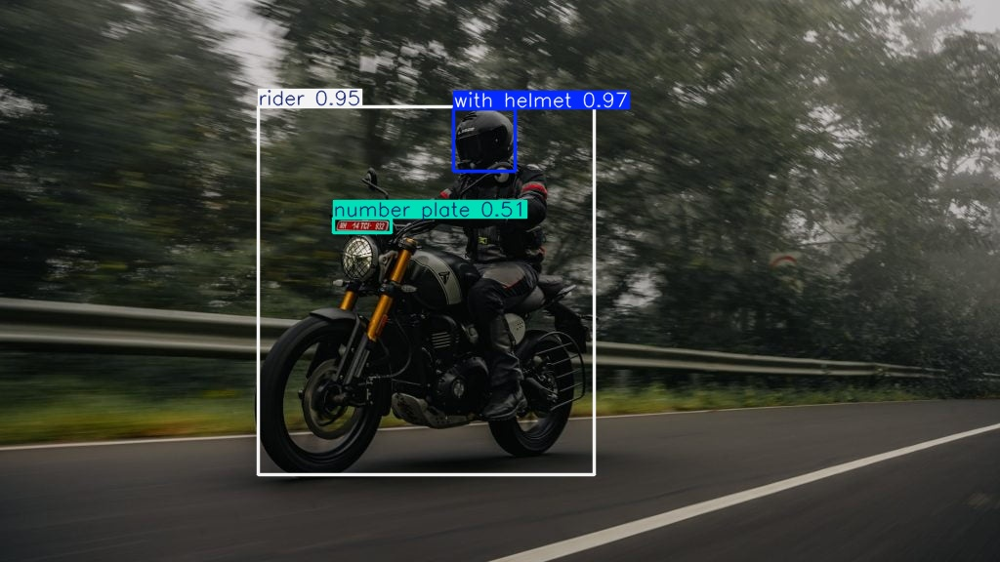

In [ ]:
# Prediction 1
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict6/new200.jpg')

In [ ]:
# Prediction 2: image from dataset
results = model('C:/Users/RyRyN/Desktop/Datasets/MotorcycleHelmetDataset/images/val/new193.jpg', save=True)


image 1/1 C:\Users\RyRyN\Desktop\Datasets\MotorcycleHelmetDataset\images\val\new193.jpg: 384x640 2 with helmets, 3 riders, 1 number plate, 227.7ms
Speed: 4.0ms preprocess, 227.7ms inference, 10.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict6


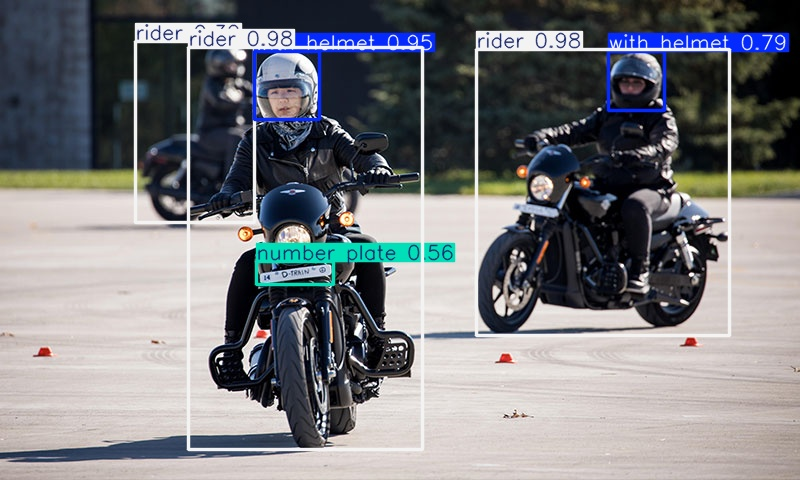

In [ ]:
# Prediction 2
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict6/new193.jpg')

In [ ]:
# Prediction 3: image from internet
results = model('https://i0.wp.com/emodiblog.com/wp-content/uploads/2020/12/IN23138.jpeg', save=True)


Found https://i0.wp.com/emodiblog.com/wp-content/uploads/2020/12/IN23138.jpeg locally at IN23138.jpeg
image 1/1 C:\Users\RyRyN\IN23138.jpeg: 448x640 2 with helmets, 1 without helmet, 3 riders, 3 number plates, 64.6ms
Speed: 4.6ms preprocess, 64.6ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict6


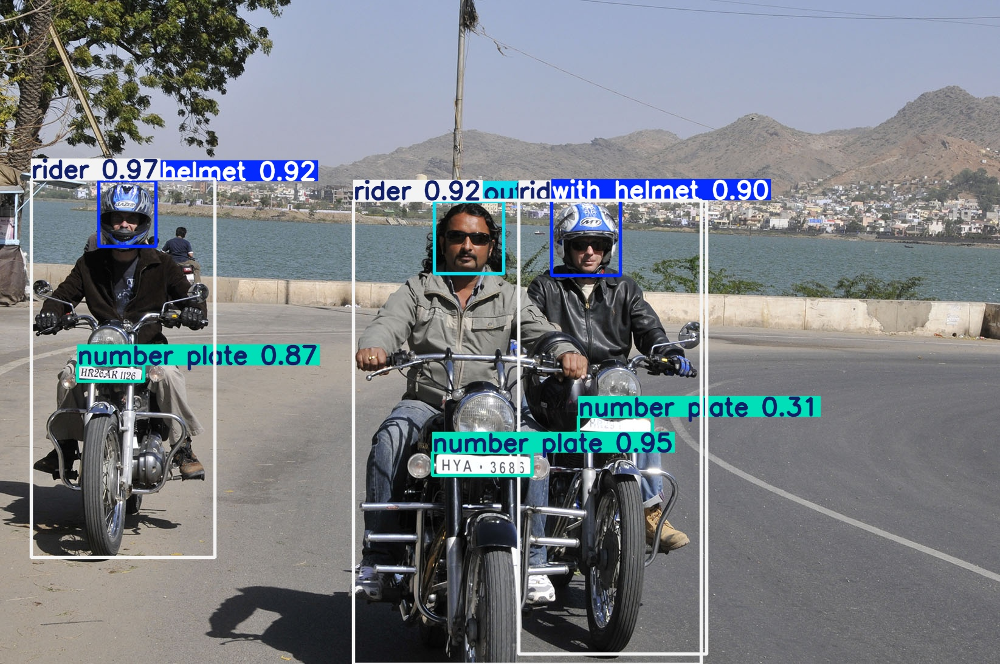

In [ ]:
# Prediction 3
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict6/IN23138.jpg')

In [ ]:
# Prediction 4: image from internet
results = model('https://asset.kompas.com/crops/K_m7YMjIBYTUr2BNiRLsK8pG2-E=/1526x533:3458x1820/1200x800/data/photo/2023/12/06/657008588aa92.jpeg', save=True)


Found https://asset.kompas.com/crops/K_m7YMjIBYTUr2BNiRLsK8pG2-E=/1526x533:3458x1820/1200x800/data/photo/2023/12/06/657008588aa92.jpeg locally at 657008588aa92.jpeg
image 1/1 C:\Users\RyRyN\657008588aa92.jpeg: 448x640 2 without helmets, 1 rider, 1 number plate, 33.1ms
Speed: 3.5ms preprocess, 33.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict6


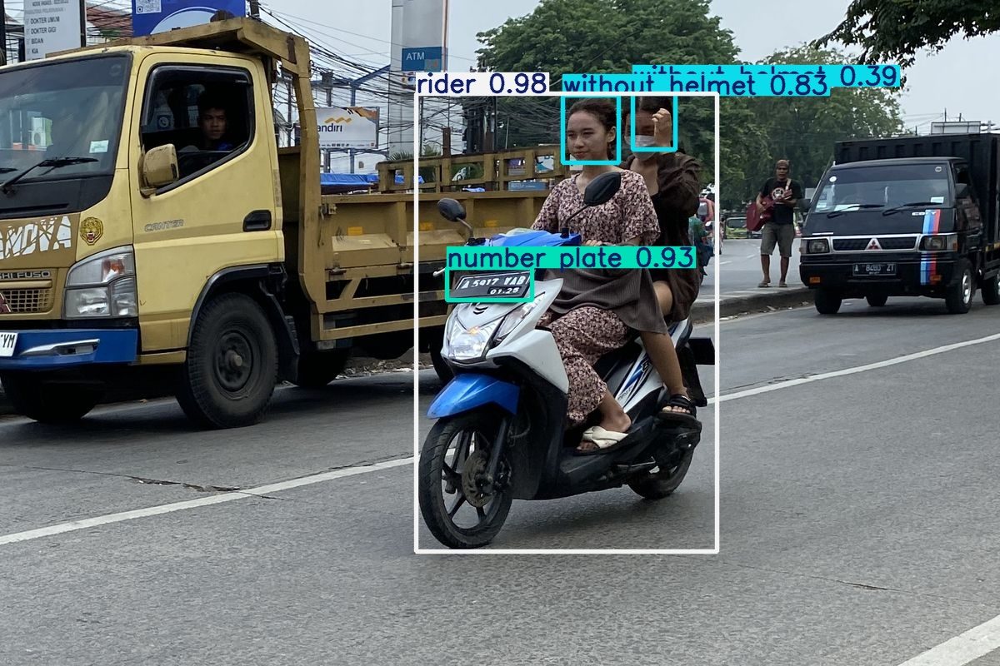

In [ ]:
# Prediction 4
%matplotlib inline
from PIL import Image

Image.open('C:/Users/RyRyN/runs/detect/predict6/657008588aa92.jpg')

# **Finding the best parameters**

**Learning Rates**

In [ ]:
for lr in [0.01, 0.001, 0.0005, 0.0001]:
    model.train(data="config.yaml", epochs=5, patience=5, batch=8, lr0=lr, imgsz=640, name=f"lr_{lr}")

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=lr_0.01, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tru

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/lr_0.01/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/lr_0.01
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5       2.2G      2.252      2.913      2.009         54        640: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         40        182      0.503      0.229      0.213     0.0985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.27G      1.597      1.989      1.523         60        640: 100%|██████████| 18/18 [00:06<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         40        182      0.586      0.502      0.516        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.28G      1.397      1.443      1.381         50        640: 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.06it/s]

                   all         40        182      0.647      0.604      0.657      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.28G      1.253       1.24      1.293         56        640: 100%|██████████| 18/18 [00:07<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         40        182      0.729      0.657      0.709      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.27G      1.275      1.264       1.32         68        640: 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.01it/s]

                   all         40        182      0.743      0.689      0.734      0.483



5 epochs completed in 0.014 hours.
Optimizer stripped from runs/detect/lr_0.01/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/lr_0.01/weights/best.pt, 22.5MB

Validating runs/detect/lr_0.01/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]


                   all         40        182      0.743      0.688      0.734      0.483
           with helmet         23         31      0.463      0.835       0.75       0.49
        without helmet         20         39      0.759       0.59      0.634      0.428
                 rider         40         60      0.869      0.767       0.83      0.557
          number plate         38         52      0.879      0.561      0.722      0.455
Speed: 1.9ms preprocess, 6.8ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/lr_0.01
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=lr_0.001, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/lr_0.001/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/lr_0.001
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.52G      1.198      1.137      1.304         54        640: 100%|██████████| 18/18 [00:05<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         40        182      0.799      0.604       0.74      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.21G      1.041      1.017      1.195         60        640: 100%|██████████| 18/18 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         40        182      0.768      0.707      0.773      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.31G      1.031     0.9881      1.197         50        640: 100%|██████████| 18/18 [00:07<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         40        182      0.834      0.669      0.787      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.24G      1.013     0.9548      1.179         56        640: 100%|██████████| 18/18 [00:04<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]


                   all         40        182      0.813      0.703      0.801      0.525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.23G      1.082          1      1.226         68        640: 100%|██████████| 18/18 [00:05<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         40        182      0.901      0.664      0.803      0.533



5 epochs completed in 0.016 hours.
Optimizer stripped from runs/detect/lr_0.001/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/lr_0.001/weights/best.pt, 22.5MB

Validating runs/detect/lr_0.001/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


                   all         40        182      0.901      0.664      0.803      0.534
           with helmet         23         31      0.861      0.839      0.835      0.543
        without helmet         20         39      0.798      0.507      0.652      0.424
                 rider         40         60      0.978      0.727      0.898      0.665
          number plate         38         52      0.968      0.583      0.828      0.504
Speed: 0.3ms preprocess, 6.5ms inference, 0.0ms loss, 8.4ms postprocess per image
Results saved to runs/detect/lr_0.001
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=lr_0.0005, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministi

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/lr_0.0005/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/lr_0.0005
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.52G     0.9124     0.8385      1.163         54        640: 100%|██████████| 18/18 [00:10<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         40        182      0.814      0.674      0.778      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.26G     0.8142     0.7777      1.091         60        640: 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]

                   all         40        182      0.782       0.76      0.798       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.26G     0.8782     0.8002      1.112         50        640: 100%|██████████| 18/18 [00:07<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         40        182      0.781      0.778      0.797      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.26G     0.8985     0.8058      1.117         56        640: 100%|██████████| 18/18 [00:06<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         40        182       0.78      0.749      0.818      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.25G      1.015     0.8846      1.176         68        640: 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]


                   all         40        182      0.878       0.69      0.817       0.54

5 epochs completed in 0.021 hours.
Optimizer stripped from runs/detect/lr_0.0005/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/lr_0.0005/weights/best.pt, 22.5MB

Validating runs/detect/lr_0.0005/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


                   all         40        182      0.878       0.69      0.817      0.539
           with helmet         23         31        0.8      0.839      0.837       0.52
        without helmet         20         39      0.818      0.513       0.67      0.441
                 rider         40         60      0.953      0.783      0.914      0.698
          number plate         38         52      0.942      0.624      0.849      0.498
Speed: 0.3ms preprocess, 6.5ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/lr_0.0005
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=lr_0.0001, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, determinist

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/lr_0.0001/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/lr_0.0001
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.52G     0.7326     0.6762      1.079         54        640: 100%|██████████| 18/18 [00:11<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         40        182      0.792      0.692      0.775      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.25G     0.6926       0.65       1.03         60        640: 100%|██████████| 18/18 [00:04<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.36it/s]

                   all         40        182      0.751      0.735      0.772      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.25G      0.794     0.6964      1.068         50        640: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         40        182      0.814       0.74      0.789      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.26G     0.8856     0.7484      1.097         56        640: 100%|██████████| 18/18 [00:06<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]

                   all         40        182      0.781      0.773      0.822      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.26G     0.9807     0.8302      1.156         68        640: 100%|██████████| 18/18 [00:04<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.20it/s]

                   all         40        182      0.801       0.75      0.816      0.541



5 epochs completed in 0.020 hours.
Optimizer stripped from runs/detect/lr_0.0001/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/lr_0.0001/weights/best.pt, 22.5MB

Validating runs/detect/lr_0.0001/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


                   all         40        182      0.781      0.773      0.822      0.544
           with helmet         23         31      0.628      0.871       0.81      0.522
        without helmet         20         39      0.739      0.538       0.68      0.451
                 rider         40         60      0.897       0.85      0.907      0.668
          number plate         38         52      0.861      0.832      0.891      0.536
Speed: 0.2ms preprocess, 5.6ms inference, 0.1ms loss, 3.4ms postprocess per image
Results saved to runs/detect/lr_0.0001


**Image Sizes**

In [ ]:
for imgsz in [640, 800, 1280]:
    model.train(data="config.yaml", epochs=5, patience=5, batch=8, lr0=0.05, imgsz=imgsz, name=f"imgsz_{imgsz}")

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=imgsz_640, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/imgsz_640/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/imgsz_640
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.49G     0.6518     0.5858      1.031         54        640: 100%|██████████| 18/18 [00:06<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.47it/s]

                   all         40        182      0.831      0.699      0.798      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.22G     0.6511     0.5958     0.9986         60        640: 100%|██████████| 18/18 [00:06<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         40        182      0.804      0.738      0.785      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.34G     0.7553     0.6556      1.044         50        640: 100%|██████████| 18/18 [00:06<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         40        182      0.811      0.785      0.805      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.23G     0.8099     0.6778      1.063         56        640: 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         40        182      0.784      0.789      0.809      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.25G     0.9676     0.7983      1.138         68        640: 100%|██████████| 18/18 [00:07<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         40        182      0.802      0.806      0.805       0.52



5 epochs completed in 0.020 hours.
Optimizer stripped from runs/detect/imgsz_640/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/imgsz_640/weights/best.pt, 22.5MB

Validating runs/detect/imgsz_640/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


                   all         40        182      0.816      0.783      0.805      0.548
           with helmet         23         31      0.714      0.871      0.825      0.544
        without helmet         20         39      0.768      0.595      0.617      0.414
                 rider         40         60      0.869      0.883      0.913      0.722
          number plate         38         52       0.91      0.782      0.865      0.511
Speed: 1.1ms preprocess, 7.3ms inference, 0.0ms loss, 8.4ms postprocess per image
Results saved to runs/detect/imgsz_640
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=imgsz_800, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, determinist

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/imgsz_800/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/detect/imgsz_800
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      3.52G     0.9413     0.8255      1.187         54        800: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         40        182      0.786      0.721      0.787      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      3.37G     0.8661     0.7527      1.127         60        800: 100%|██████████| 18/18 [00:07<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         40        182      0.785       0.72      0.788      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      3.22G     0.8966     0.7792      1.151         50        800: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         40        182      0.756      0.756       0.78       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       3.4G     0.8896     0.7678      1.154         57        800: 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         40        182      0.848       0.72      0.808      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      3.26G     0.9819     0.8308      1.209         68        800: 100%|██████████| 18/18 [00:09<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

                   all         40        182      0.848       0.74      0.819      0.537



5 epochs completed in 0.023 hours.
Optimizer stripped from runs/detect/imgsz_800/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/imgsz_800/weights/best.pt, 22.5MB

Validating runs/detect/imgsz_800/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


                   all         40        182      0.848      0.737      0.819      0.536
           with helmet         23         31      0.788      0.871      0.881      0.561
        without helmet         20         39      0.765        0.5       0.62      0.431
                 rider         40         60       0.89       0.81      0.898      0.597
          number plate         38         52      0.948      0.769      0.878      0.553
Speed: 0.9ms preprocess, 7.7ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/imgsz_800
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=imgsz_1280, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, determini

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/imgsz_1280/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to runs/detect/imgsz_1280
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5       7.8G      1.271      1.409      1.576         54       1280: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.15s/it]

                   all         40        182      0.746      0.604      0.675      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.52G      1.135      1.133      1.439         60       1280: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all         40        182      0.736      0.606      0.675      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.42G       1.13      1.143      1.441         50       1280: 100%|██████████| 18/18 [00:13<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.31it/s]

                   all         40        182      0.706      0.644      0.663       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.56G      1.071      1.069       1.39         57       1280: 100%|██████████| 18/18 [00:11<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all         40        182      0.792      0.652      0.699      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.54G      1.162      1.115      1.464         68       1280: 100%|██████████| 18/18 [00:14<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         40        182      0.823       0.67      0.746      0.468



5 epochs completed in 0.035 hours.
Optimizer stripped from runs/detect/imgsz_1280/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/imgsz_1280/weights/best.pt, 22.6MB

Validating runs/detect/imgsz_1280/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]


                   all         40        182      0.822      0.673      0.747      0.469
           with helmet         23         31      0.723      0.806      0.818      0.505
        without helmet         20         39      0.771      0.513      0.639      0.444
                 rider         40         60      0.871      0.675      0.716      0.414
          number plate         38         52      0.924      0.699      0.815      0.514
Speed: 1.0ms preprocess, 16.5ms inference, 0.0ms loss, 11.6ms postprocess per image
Results saved to runs/detect/imgsz_1280


**Batch Sizes**

In [ ]:
for batch_size in [4, 8, 16, 32]:
    model.train(data="config.yaml",  epochs=5, patience=5, batch=batch_size, lr0=0.05, imgsz=640, name=f"batch_{batch_size}"
    )

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=batch_4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tru

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/batch_4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/batch_4
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.58G     0.9608      0.882       1.17         20        640: 100%|██████████| 36/36 [00:08<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

                   all         40        182      0.805      0.715      0.769      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.34G     0.9711     0.8283      1.157         31        640: 100%|██████████| 36/36 [00:06<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.90it/s]

                   all         40        182      0.797       0.67      0.789      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.31G     0.9864     0.8291      1.148         25        640: 100%|██████████| 36/36 [00:06<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.08it/s]

                   all         40        182       0.84       0.66      0.772      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.31G     0.9288     0.7731      1.139         26        640: 100%|██████████| 36/36 [00:09<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]

                   all         40        182      0.767      0.752       0.81      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.31G     0.9079     0.7465       1.12         26        640: 100%|██████████| 36/36 [00:05<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.05it/s]

                   all         40        182      0.772       0.76      0.822      0.568



5 epochs completed in 0.023 hours.
Optimizer stripped from runs/detect/batch_4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/batch_4/weights/best.pt, 22.5MB

Validating runs/detect/batch_4/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.04it/s]


                   all         40        182      0.773      0.759      0.823      0.568
           with helmet         23         31      0.699      0.825      0.821      0.518
        without helmet         20         39       0.68      0.615      0.693      0.489
                 rider         40         60      0.864      0.883      0.915      0.731
          number plate         38         52      0.849      0.712      0.864      0.534
Speed: 0.3ms preprocess, 12.3ms inference, 0.0ms loss, 10.5ms postprocess per image
Results saved to runs/detect/batch_4
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=batch_8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/batch_8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/batch_8
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.52G     0.6411     0.5661      1.015         54        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all         40        182      0.786      0.722      0.784      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.34G     0.6182     0.5381     0.9775         60        640: 100%|██████████| 18/18 [00:04<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.16it/s]

                   all         40        182      0.852      0.716      0.809      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.26G     0.6921     0.5615      1.013         50        640: 100%|██████████| 18/18 [00:04<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         40        182      0.863      0.723      0.825      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.23G     0.7414     0.5955      1.027         56        640: 100%|██████████| 18/18 [00:07<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]

                   all         40        182      0.809      0.765      0.822      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.26G     0.8703     0.6603      1.086         68        640: 100%|██████████| 18/18 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all         40        182      0.814      0.771      0.833      0.567



5 epochs completed in 0.022 hours.
Optimizer stripped from runs/detect/batch_8/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/batch_8/weights/best.pt, 22.5MB

Validating runs/detect/batch_8/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


                   all         40        182      0.863      0.723      0.825      0.579
           with helmet         23         31      0.812      0.806      0.848      0.572
        without helmet         20         39      0.783      0.556      0.668      0.462
                 rider         40         60      0.947      0.817      0.921       0.74
          number plate         38         52       0.91      0.712      0.863      0.542
Speed: 0.2ms preprocess, 6.1ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/batch_8
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=batch_16, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/batch_16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/batch_16
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      4.34G     0.7191     0.5673      1.034        106        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         40        182      0.824      0.759      0.826      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      4.24G     0.8007     0.6134      1.055        147        640: 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]


                   all         40        182      0.817       0.74      0.824       0.57

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      4.29G     0.8071     0.6211      1.054         92        640: 100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         40        182      0.746       0.78      0.824      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      4.22G     0.8211     0.6211      1.061        117        640: 100%|██████████| 9/9 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]


                   all         40        182      0.816      0.722      0.821      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       4.3G     0.7855     0.6152      1.045        126        640: 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         40        182      0.806      0.775      0.835       0.58



5 epochs completed in 0.020 hours.
Optimizer stripped from runs/detect/batch_16/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/batch_16/weights/best.pt, 22.5MB

Validating runs/detect/batch_16/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]


                   all         40        182      0.806      0.775      0.836       0.58
           with helmet         23         31      0.679      0.871      0.836      0.543
        without helmet         20         39      0.786      0.566      0.705      0.486
                 rider         40         60      0.902       0.85      0.943       0.75
          number plate         38         52      0.858      0.813       0.86       0.54
Speed: 0.4ms preprocess, 5.5ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/batch_16
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/custom_training_run/weights/best.pt, data=config.yaml, epochs=5, time=None, patience=5, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=batch_32, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministi

train: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/train.cache... 143 images, 0 backgrounds, 2 corrupt: 100%|██████████| 145/145 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new128.jpg'
train: WARNING ⚠️ /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/images/train/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'png', 'bmp', 'webp', 'pfm', 'jpeg', 'tif', 'jpg', 'heic', 'tiff', 'mpo', 'dng'}
videos: {'gif', 'mpg', 'mpeg', 'asf', 'm4v', 'ts', 'mkv', 'wmv', 'avi', 'mov', 'webm', 'mp4'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/SFU/300 Level Courses/IAT360/ComputerVisionProject/ComputerVisionDataset/labels/val.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]


Plotting labels to runs/detect/batch_32/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/batch_32
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.98G     0.6387     0.5322       1.01        102        640: 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

                   all         40        182       0.81      0.762      0.836      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.85G     0.7001     0.5635      1.009        128        640: 100%|██████████| 5/5 [00:02<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

                   all         40        182      0.821      0.742      0.831      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.78G     0.7389     0.5664      1.027         93        640: 100%|██████████| 5/5 [00:02<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         40        182       0.83      0.726      0.827       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.77G     0.7761     0.5725       1.04        122        640: 100%|██████████| 5/5 [00:02<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

                   all         40        182      0.861      0.728      0.839      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.85G     0.7412     0.5614      1.027        117        640: 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         40        182      0.832      0.755      0.838       0.58



5 epochs completed in 0.018 hours.
Optimizer stripped from runs/detect/batch_32/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/batch_32/weights/best.pt, 22.5MB

Validating runs/detect/batch_32/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


                   all         40        182       0.82      0.741      0.828      0.583
           with helmet         23         31      0.725      0.871      0.853       0.56
        without helmet         20         39      0.785      0.563      0.698      0.491
                 rider         40         60      0.892      0.825      0.911      0.729
          number plate         38         52       0.88      0.705       0.85      0.552
Speed: 0.2ms preprocess, 5.2ms inference, 0.0ms loss, 8.8ms postprocess per image
Results saved to runs/detect/batch_32


In [ ]:
for epochs_size in [4, 8, 16, 32]:
    model.train(data="config.yaml",  epochs=epochs_size, patience=5, batch=32, lr0=0.05, imgsz=640, name=f"batch_{batch_size}"
    )

Best Hyperparameters: **lr0 = 0.05, imgsz = 640, batch = 32, epochs = 10**